In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import os

In [2]:
creditcard=pd.read_csv("creditcard.csv")
creditcard.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


# Basic EDA

In [3]:
creditcard.describe() 

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.758743e-12,-8.252298e-13,-9.636929e-13,8.316157e-13,1.591952e-13,4.247354e-13,-3.050180e-13,8.693344e-14,-1.179712e-12,...,-3.406543e-13,-5.713163e-13,-9.725303e-13,1.464139e-12,-6.989087e-13,-5.615260e-13,3.332112e-12,-3.518886e-12,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [5]:
creditcard["Amount"].describe() 

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

In [5]:
#numerical summary -> only non-anonymized columns of interest
pd.set_option('precision', 2)
creditcard[["Amount","Time"]].describe() 

,Amount,Time
count,284807.00,284807.00
mean,88.35,94813.86
std,250.12,47488.15
min,0.00,0.00
25%,5.60,54201.50
50%,22.00,84692.00
75%,77.16,139320.50
max,25691.16,172792.00


In [6]:
creditcard.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

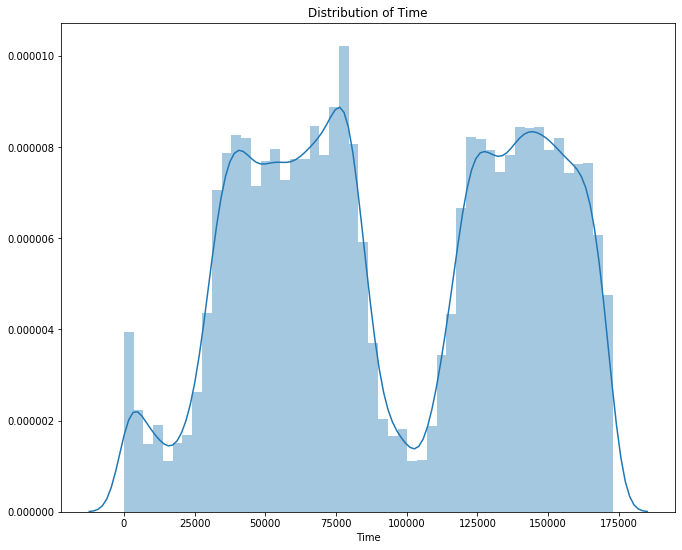

In [7]:
plt.figure(figsize=(11,9))
plt.title('Distribution of Time')
sns.distplot(creditcard["Time"])

## Pairplots

In [ ]:
#sns.pairplot(creditcard[["Time,V1,V2,V3,V4"]])

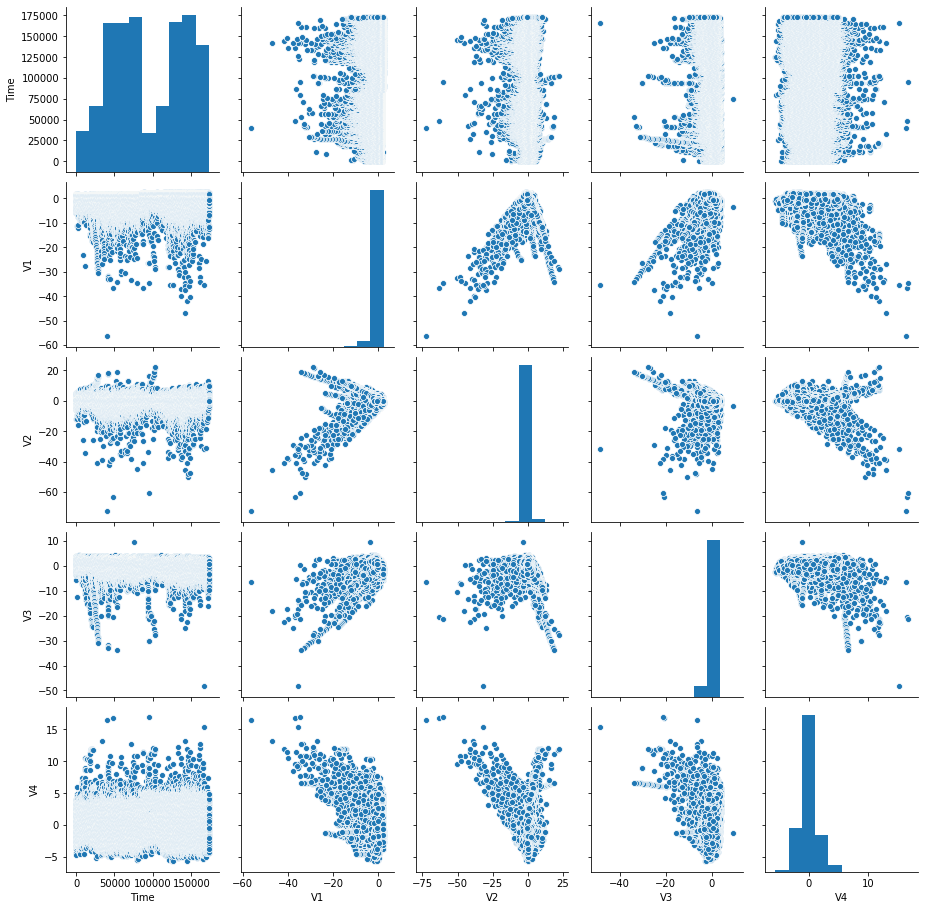

In [16]:
sns.pairplot(creditcard[["Time","V1","V2","V3","V4"]])

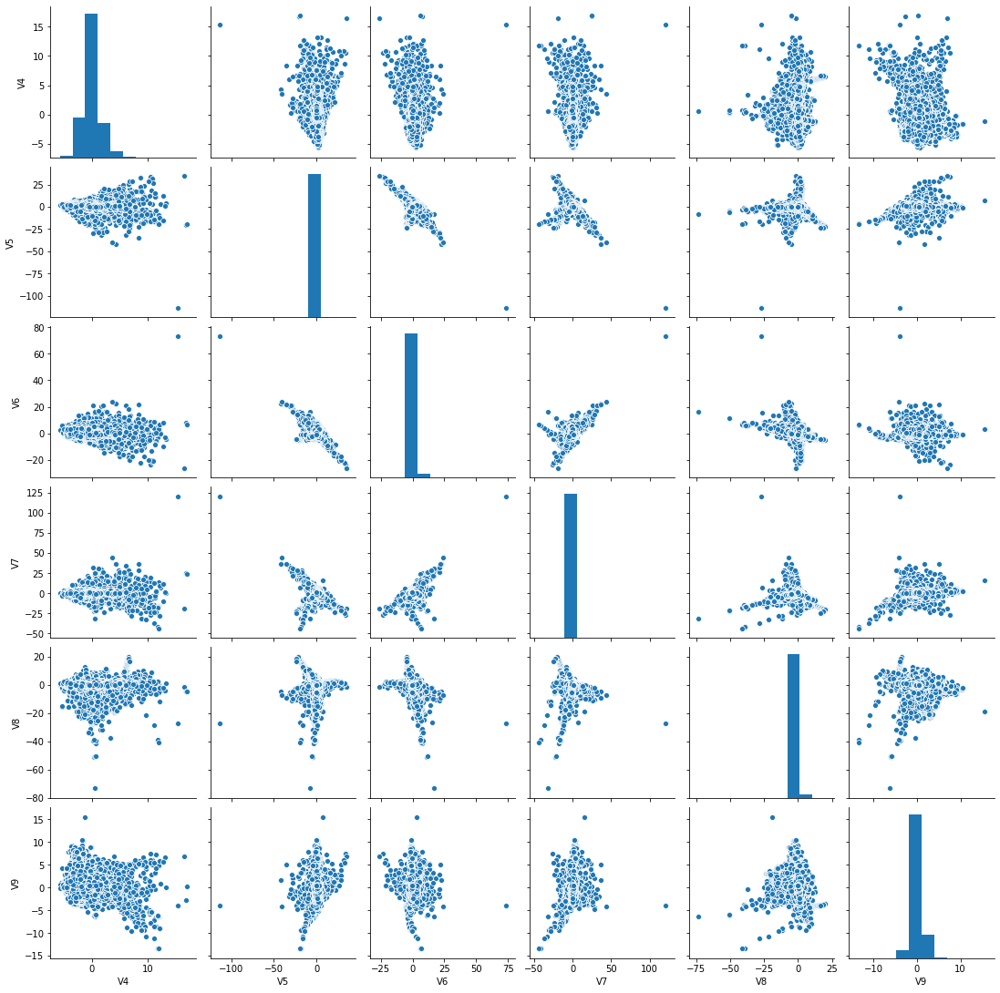

In [20]:
sns.pairplot(creditcard[['V4','V5', 'V6', 'V7', 'V8', 'V9']])

In [18]:
creditcard.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [ ]:
#sns.pairplot(creditcard[['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10']])

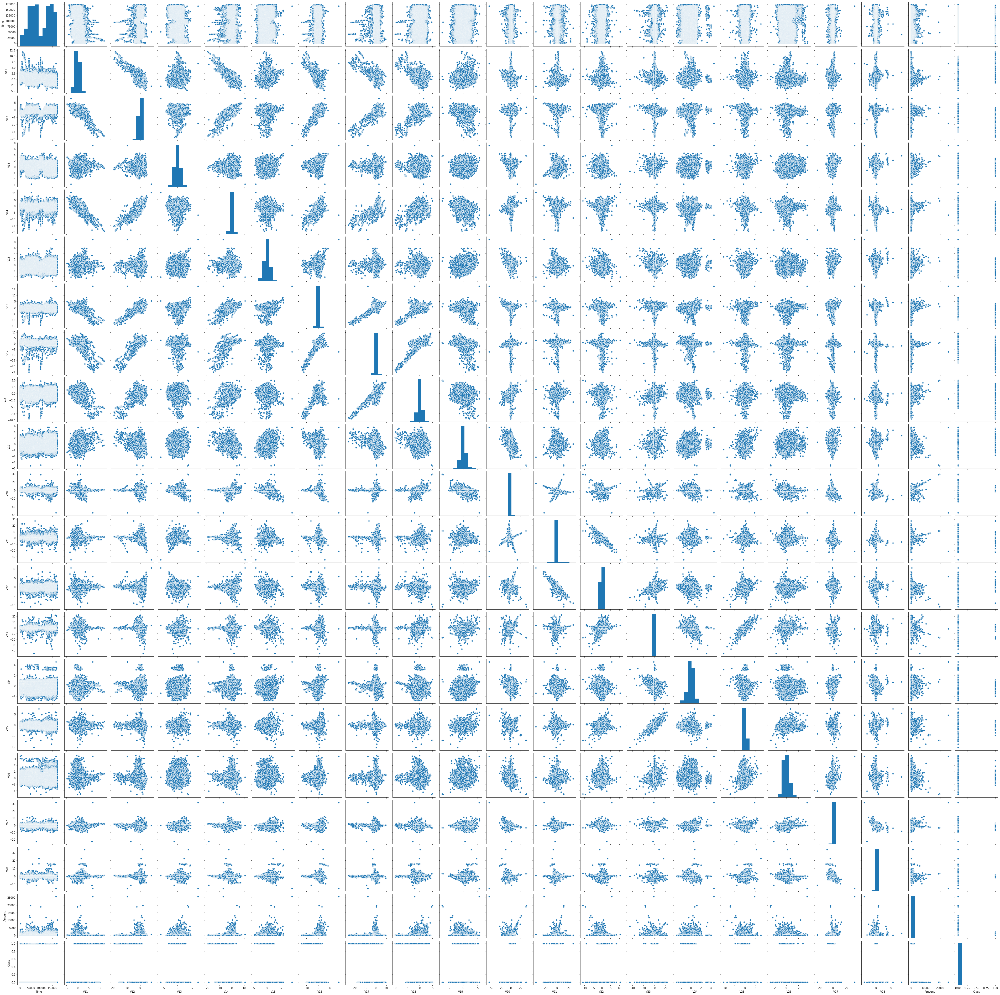

In [21]:
sns.pairplot(creditcard[['Time', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20','V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount','Class']])

Negative Correlations: V17, V14, V12 and V10 are negatively correlated. Notice how the lower these values are, the more likely the end result will be a fraud transaction.
Positive Correlations: V2, V4, V11, and V19 are positively correlated. Notice how the higher these values are, the more likely the end result will be a fraud transaction.

In [6]:
creditcard.shape

(284807, 31)

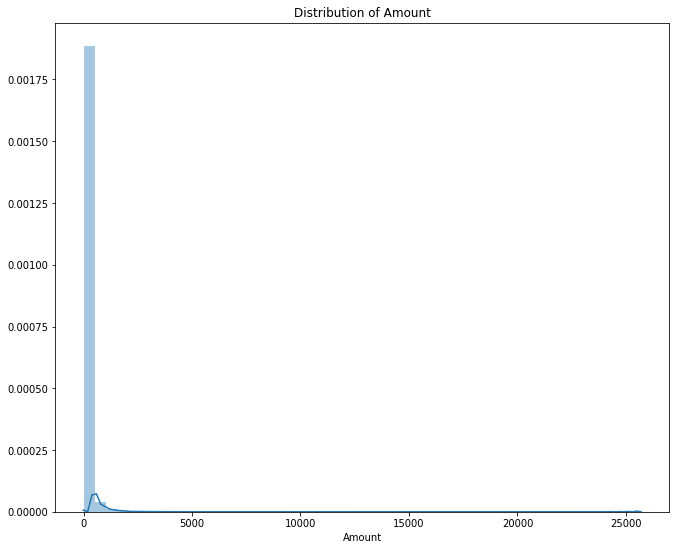

In [6]:
plt.figure(figsize=(11,9))
plt.title('Distribution of Amount')
sns.distplot(creditcard["Amount"])

In [9]:
counts = creditcard["Class"].value_counts()
counts


0    284315
1       492
Name: Class, dtype: int64

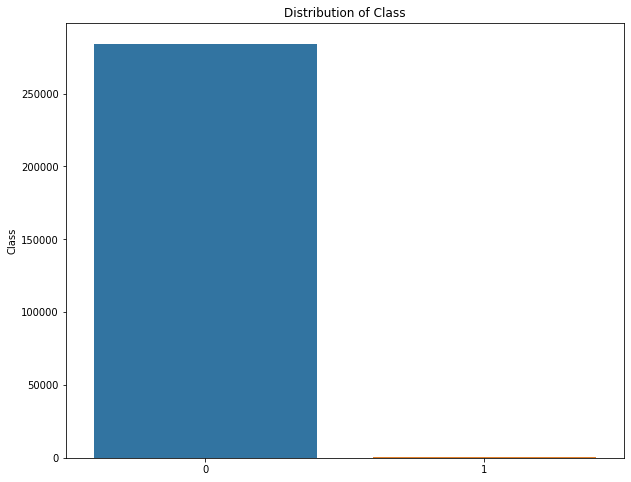

In [10]:
plt.figure(figsize=(10,8))
plt.title('Distribution of Class')
sns.barplot(x=counts.index, y=counts)

# Scaling Amount and time

In [4]:
from sklearn.preprocessing import StandardScaler, RobustScaler
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

creditcard['scaled_amount'] = rob_scaler.fit_transform(creditcard['Amount'].values.reshape(-1,1))
creditcard['scaled_time'] = rob_scaler.fit_transform(creditcard['Time'].values.reshape(-1,1))

creditcard.drop(['Time','Amount'], axis=1, inplace=True)

Amount_scaled = creditcard['scaled_amount']
Time_scaled = creditcard['scaled_time']

In [5]:
creditcard.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0,1.783274,-0.994983
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0,-0.269825,-0.994983
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0,4.983721,-0.994972
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0,1.418291,-0.994972
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0,0.670579,-0.994960


# subselection...

 The unbalanced data should be balanced.In this scenario, our subsample will be a dataframe with a 50/50 ratio of fraud and non-fraud transactions. Meaning our sub-sample will have the same amount of fraud and non fraud transactions.

In [6]:
frauds = len(creditcard[creditcard['Class'] == 1])
frauds

492

In [7]:
clean = len(creditcard[creditcard['Class'] == 0])
clean

284315

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import KFold, StratifiedKFold

#print('No Frauds', round(df['Class'].value_counts()[0]/len(df) * 100,2), '% of the dataset')
#print('Frauds', round(df['Class'].value_counts()[1]/len(df) * 100,2), '% of the dataset')

X = creditcard.drop('Class', axis=1)
Y = creditcard['Class']

stkf= StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

for train_index, test_index in stkf.split(X, Y):
    print("Train:", train_index, "Test:", test_index)
    original_Xtrain, original_Xtest = X.iloc[train_index], X.iloc[test_index]
    original_Ytrain, original_Ytest = Y.iloc[train_index], Y.iloc[test_index]

# We already have X_train and y_train for undersample data thats why I am using original to distinguish and to not overwrite these variables.
# original_Xtrain, original_Xtest, original_ytrain, original_ytest = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the Distribution of the labels


# Turn into an array
original_Xtrain = original_Xtrain.values
original_Xtest = original_Xtest.values
original_Ytrain = original_Ytrain.values
original_Ytest = original_Ytest.values

# See if both the train and test label distribution are similarly distributed
train_unique_label, train_counts_label = np.unique(original_Ytrain, return_counts=True)
test_unique_label, test_counts_label = np.unique(original_Ytest, return_counts=True)
print('-' * 100)
'''
print('Label Distributions: \n')
print(train_counts_label/ len(original_ytrain))
print(test_counts_label/ len(original_ytest)
'''

Train: [ 30473  30496  31002 ... 284804 284805 284806] Test: [    0     1     2 ... 57017 57018 57019]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 30473  30496  31002 ... 113964 113965 113966]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 81609  82400  83053 ... 170946 170947 170948]
Train: [     0      1      2 ... 284804 284805 284806] Test: [150654 150660 150661 ... 227866 227867 227868]
Train: [     0      1      2 ... 227866 227867 227868] Test: [212516 212644 213092 ... 284804 284805 284806]
----------------------------------------------------------------------------------------------------


"\nprint('Label Distributions: \n')\nprint(train_counts_label/ len(original_ytrain))\nprint(test_counts_label/ len(original_ytest)\n"

In [9]:
# Since our classes are highly skewed we should make them equivalent in order to have a normal distribution of the classes.

# Lets shuffle the data before creating the subsamples
## balancing the data  


creditcard = creditcard.sample(frac=1)

# amount of fraud classes 492 rows.
fraud_df = creditcard.loc[creditcard['Class'] == 1]
clean_df = creditcard.loc[creditcard['Class'] == 0][:492]

balance_df = pd.concat([fraud_df, clean_df])

# Shuffle dataframe rows
New_df = balance_df.sample(frac=1, random_state=42)

New_df.head()


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
169330,0.177822,-0.180606,0.234247,-1.428299,-0.557438,-0.829679,0.664653,-0.309390,-1.034651,0.170116,...,1.147341,0.275420,0.077993,-1.115177,-0.298152,0.236476,0.270046,0,1.290854,0.410613
112840,-1.111495,-0.257575,2.250210,1.152671,0.432904,1.254126,-0.584163,-0.609682,1.014602,0.334533,...,0.927825,-0.343058,-0.256268,-0.600742,-0.180331,0.026762,-0.358335,1,0.321805,-0.139428
212757,-1.071846,1.878922,-0.122267,-0.252395,0.413714,-1.711057,1.355590,-0.832346,0.485218,0.362113,...,1.334051,-0.120898,0.817741,-0.577301,-0.313113,-0.536657,0.160889,0,-0.240481,0.637848
250761,-0.512349,4.827060,-7.973939,7.334059,0.367704,-2.055129,-2.935856,1.431008,-4.544722,-5.258096,...,-0.459496,-0.009364,-1.140436,-0.006445,0.527970,0.558881,0.126517,1,-0.296653,0.826631
43428,-16.526507,8.584972,-18.649853,9.505594,-13.793819,-2.832404,-16.701694,7.517344,-8.507059,-14.110184,...,-1.127670,-2.358579,0.673461,-1.413700,-0.462762,-2.018575,-1.042804,1,4.781527,-0.507372


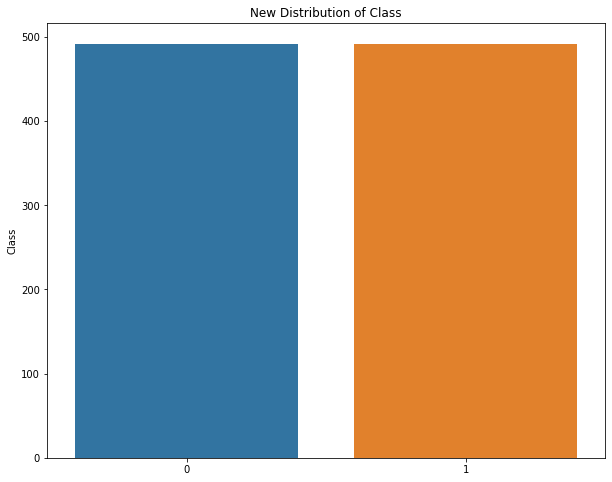

In [10]:
counts_new= New_df["Class"].value_counts()
counts_new
plt.figure(figsize=(10,8))
plt.title('New Distribution of Class')
sns.barplot(x=counts_new.index, y=counts_new)

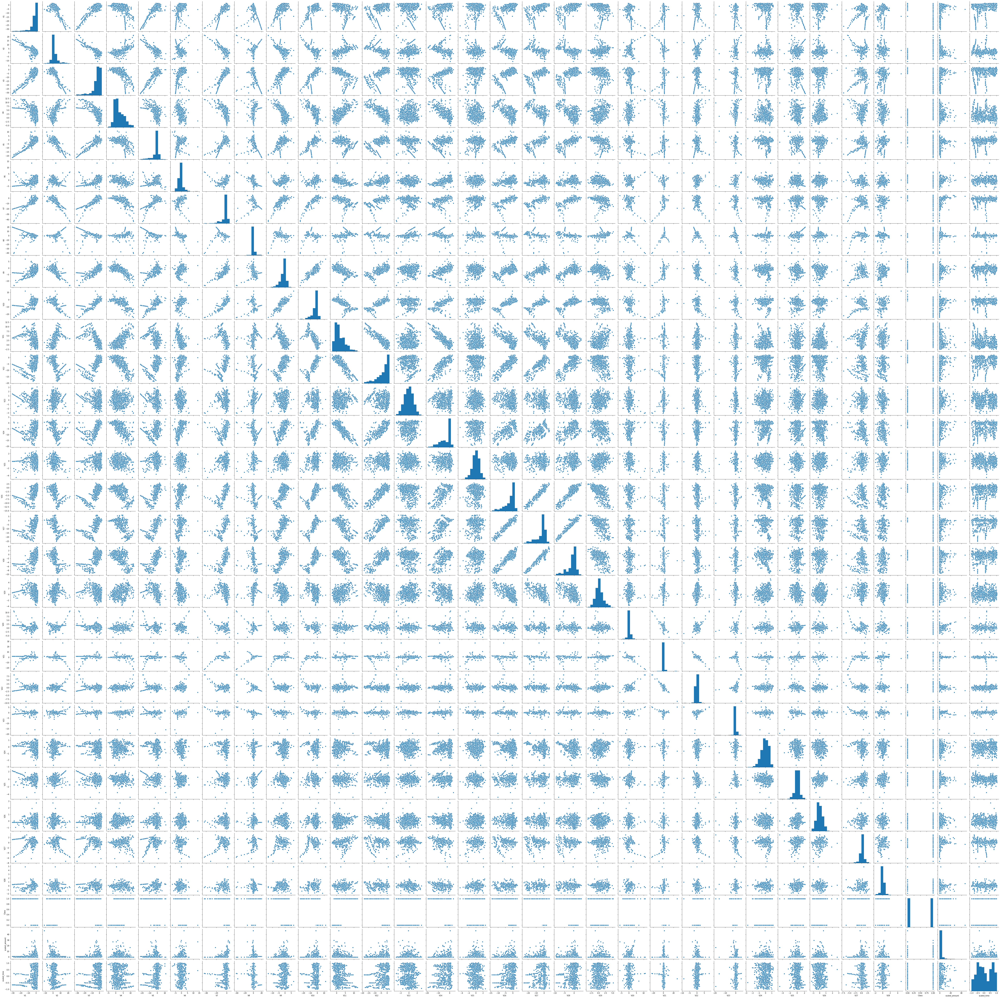

In [10]:
sns.pairplot(New_df)

# Corelations 

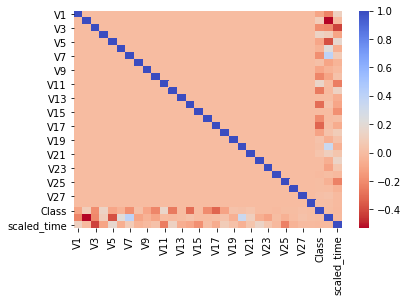

In [13]:
## Corr of Unbalanced data  
corr_imbalnce= creditcard.corr()
sns.heatmap(corr_imbalnce,cmap='coolwarm_r')

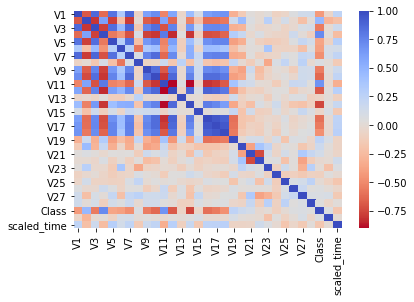

In [14]:
corr_balance=New_df.corr()
sns.heatmap(corr_balance,cmap='coolwarm_r')

In [ ]:
# Negative corr 
#class-v10,v12,v14,v17,v16
#Positive Corr 
# class-v2,v14,v11,v19


In [11]:
New_df.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Class',
       'scaled_amount', 'scaled_time'],
      dtype='object')

# Dimension Reduction

In [ ]:
#https://datascience.stackexchange.com/questions/65815/chose-among-highly-correlated-variables

#I suggest you check correlation first and possibly also the variance inflation factor from linear regression.
#In order to perform feature selection, you could use Lasso/Ridge regression, which works like an "automated" 
#way of selecting features based on importance for prediction.
#Permutation feature importance  

#https://etav.github.io/python/vif_factor_python.html

# VIF

Steps for Implementing VIF
Run a multiple regression.
Calculate the VIF factors.
Inspect the factors for each predictor variable, if the VIF is between 5-10, multicolinearity is likely present and you should consider dropping the variable.

In [19]:
New_df.columns

Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11',
       'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Class',
       'scaled_amount', 'scaled_time'],
      dtype='object')

In [20]:
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
features = New_df.drop('Class', axis=1)
Dependend=New_df["Class"]

In [21]:
vif_data = pd.DataFrame()
vif_data["feature"] = features.columns
# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(features.values, i)
                          for i in range(len(features.columns))]
  
print(vif_data)


          feature    VIF
0              V1  14.43
1              V2  23.00
2              V3  32.98
3              V4  10.18
4              V5  27.90
5              V6   4.03
6              V7  63.56
7              V8   7.19
8              V9   6.46
9             V10  24.78
10            V11  13.14
11            V12  24.47
12            V13   1.22
13            V14  17.82
14            V15   1.37
15            V16  26.13
16            V17  31.39
17            V18  13.02
18            V19   2.40
19            V20   3.53
20            V21   5.25
21            V22   3.47
22            V23   2.89
23            V24   1.27
24            V25   1.59
25            V26   1.19
26            V27   1.96
27            V28   1.79
28  scaled_amount   8.82
29    scaled_time   2.12


In [ ]:
#https://machinelearningmastery.com/calculate-feature-importance-with-python/

In [22]:

# VIF OF ALL VARIBLES

vif_data_2 = pd.DataFrame()
vif_data_2["feature"] = New_df.columns
# calculating VIF for each feature
vif_data_2["VIF"] = [variance_inflation_factor(New_df.values, i)
                          for i in range(len(New_df.columns))]
  
print(vif_data_2)


          feature    VIF
0              V1  14.47
1              V2  23.79
2              V3  33.22
3              V4  10.63
4              V5  28.58
5              V6   4.15
6              V7  63.89
7              V8   7.19
8              V9   6.53
9             V10  24.78
10            V11  13.14
11            V12  24.65
12            V13   1.23
13            V14  19.27
14            V15   1.37
15            V16  26.15
16            V17  31.52
17            V18  13.05
18            V19   2.41
19            V20   3.60
20            V21   5.26
21            V22   3.52
22            V23   2.90
23            V24   1.27
24            V25   1.60
25            V26   1.20
26            V27   1.96
27            V28   1.80
28          Class   4.90
29  scaled_amount   9.33
30    scaled_time   2.12


In [23]:
# Negative corr 
#class-v10,v12,v14,v17,v16
#Positive Corr 
# class-v2,v14,v11,v19 

## VIF of features that positively and negatively affected the "Class"
IMP_features=features[['V10','V12','V14','V17','V16','V2','V4','V11','V19']]
vif_imp_features = pd.DataFrame()
vif_imp_features["feature"] = IMP_features.columns
# calculating VIF for each feature
vif_imp_features["VIF"] = [variance_inflation_factor(IMP_features.values, i)
                          for i in range(len(IMP_features.columns))]
  
print(vif_imp_features)


  feature    VIF
0     V10  10.20
1     V12  20.20
2     V14   9.52
3     V17  15.39
4     V16  21.37
5      V2   3.33
6      V4   5.92
7     V11  10.01
8     V19   1.98


In [24]:
Not_IMP_features=features.drop(['V10','V12','V14','V17','V16','V2','V4','V11','V19'], axis=1)
vif_nonimp_features= pd.DataFrame()
vif_nonimp_features["feature"] = Not_IMP_features.columns
# calculating VIF for each feature
vif_nonimp_features["VIF"] = [variance_inflation_factor(Not_IMP_features.values, i)
                          for i in range(len(Not_IMP_features.columns))]
  
print(vif_nonimp_features)


          feature    VIF
0              V1   9.44
1              V3  17.35
2              V5  11.61
3              V6   2.93
4              V7  31.98
5              V8   4.46
6              V9   4.69
7             V13   1.16
8             V15   1.18
9             V18   5.16
10            V20   2.88
11            V21   4.35
12            V22   2.89
13            V23   1.92
14            V24   1.22
15            V25   1.47
16            V26   1.13
17            V27   1.79
18            V28   1.42
19  scaled_amount   2.51
20    scaled_time   1.38


Among the non important features, anything with VIF greater than 4 will be deleted.So V6 ,V13 ,V15,V20,, V22,V23,V24, V25,V26,V27, V28,scaled_amount,scaled_time are selected. Same rule cannot be applied to Imp features as they have a high impact on Y.Now we run the VIF for the newly selected factors and the important factors.

In [25]:
Stage1_features=features.drop(['V1','V3','V5','V7','V18','V8','V9','V21'], axis=1)
vif_Stage1_features= pd.DataFrame()
vif_Stage1_features["feature"] =Stage1_features.columns
# calculating VIF for each feature
vif_Stage1_features["VIF"] = [variance_inflation_factor(Stage1_features.values, i)
                          for i in range(len(Stage1_features.columns))]
  
print(vif_Stage1_features)

          feature    VIF
0              V2   5.50
1              V4   7.05
2              V6   2.42
3             V10  16.99
4             V11  11.88
5             V12  22.44
6             V13   1.14
7             V14  14.98
8             V15   1.35
9             V16  22.68
10            V17  16.43
11            V19   2.26
12            V20   2.11
13            V22   2.06
14            V23   1.36
15            V24   1.23
16            V25   1.33
17            V26   1.14
18            V27   1.85
19            V28   1.48
20  scaled_amount   1.68
21    scaled_time   1.45


# Finding the feature Importance using decision tree 
## https://machinelearningmastery.com/calculate-feature-importance-with-python/

In [12]:
#CART Feature Importance
from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot
modelDT = DecisionTreeRegressor()
y1=New_df['Class']
x1=New_df.drop(['V1','V3','V5','V7','V18','V8','V9','V21','Class'],axis=1)
modelDT.fit(x1, y1)
# get importance
importance = modelDT.feature_importances_

In [27]:
x1.columns

Index(['V2', 'V4', 'V6', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16',
       'V17', 'V19', 'V20', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28',
       'scaled_amount', 'scaled_time'],
      dtype='object')

In [13]:
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: 0.01420
Feature: 1, Score: 0.01452
Feature: 2, Score: 0.05439
Feature: 3, Score: 0.01801
Feature: 4, Score: 0.00467
Feature: 5, Score: 0.01989
Feature: 6, Score: 0.02642
Feature: 7, Score: 0.00023
Feature: 8, Score: 0.75664
Feature: 9, Score: 0.01090
Feature: 10, Score: 0.00426
Feature: 11, Score: 0.00825
Feature: 12, Score: 0.00384
Feature: 13, Score: 0.01818
Feature: 14, Score: 0.00000
Feature: 15, Score: 0.01939
Feature: 16, Score: 0.00203
Feature: 17, Score: 0.00000
Feature: 18, Score: 0.00800
Feature: 19, Score: 0.01096
Feature: 20, Score: 0.00000
Feature: 21, Score: 0.00520


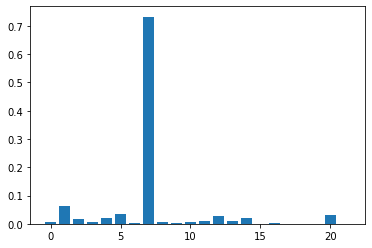

In [29]:
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

Var	slno	score	% of score	decision
V2' 	0	0.00488	 0.488	     DELETE
V4'	    1	0.05537	 5.537	  CONSIDER
V6'	    2	0	      0	          DELETE
V10'	3	0.00625	0.625	CONSIDER
V11'	4	0.01633	1.633	CONSIDER
V12'	5	0.00792	0.792	CONSIDER
V13'	6	0.00645	0.645	CONSIDER
V14'	7	0.74162	74.162	CONSIDER
V15'	8	0.00937	0.937	CONSIDER
V16'	9	0.00709	0.709	CONSIDER
V17'	10	0.00782	0.782	CONSIDER
V19'	11	0.02182	2.182	CONSIDER
V20'	12	0.0427	4.27	CONSIDER
V22'	13	 0	    0	DELETE
V23'	14	0.0057	0.57	CONSIDER
V24'	15	0.00379	0.379	DELETE
V25'	16	0.01343	1.343	CONSIDER
V26'	17	0.023	2.3	CONSIDER
V27'	18	0.01581	1.581	CONSIDER
V28'	19	0	0	DELETE
scaled_amount'	20	0.01065	1.065	CONSIDER
scaled_time']	21	0	0	DELETE

Feature: 0, Score: 0.03060
Feature: 1, Score: 0.10760
Feature: 2, Score: 0.01778
Feature: 3, Score: 0.11606
Feature: 4, Score: 0.04606
Feature: 5, Score: 0.15369
Feature: 6, Score: 0.00890
Feature: 7, Score: 0.19209
Feature: 8, Score: 0.01055
Feature: 9, Score: 0.07673
Feature: 10, Score: 0.09463
Feature: 11, Score: 0.01821
Feature: 12, Score: 0.01907
Feature: 13, Score: 0.01193
Feature: 14, Score: 0.01062
Feature: 15, Score: 0.00733
Feature: 16, Score: 0.00742
Feature: 17, Score: 0.01079
Feature: 18, Score: 0.01203
Feature: 19, Score: 0.02209
Feature: 20, Score: 0.01839
Feature: 21, Score: 0.00741


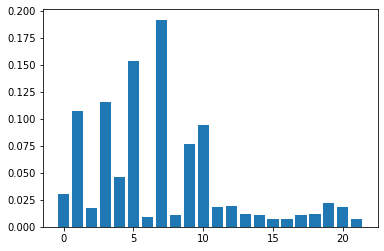

In [30]:
# Random Forest Classification Feature Importance 
# All var
from sklearn.ensemble import RandomForestClassifier
modelRFC=RandomForestClassifier()
modelRFC.fit(x1, y1)
# get importance
importance_RT = modelRFC.feature_importances_
# summarize feature importance
for i,v in enumerate(importance_RT):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_RT))], importance_RT)
pyplot.show()

Feature: 0, Score: 0.09539
Feature: 1, Score: 0.12864
Feature: 2, Score: 0.09543
Feature: 3, Score: 0.13551
Feature: 4, Score: 0.01155
Feature: 5, Score: 0.27857
Feature: 6, Score: 0.01130
Feature: 7, Score: 0.03360
Feature: 8, Score: 0.08687
Feature: 9, Score: 0.01994
Feature: 10, Score: 0.02093
Feature: 11, Score: 0.01301
Feature: 12, Score: 0.00973
Feature: 13, Score: 0.01163
Feature: 14, Score: 0.01793
Feature: 15, Score: 0.02100
Feature: 16, Score: 0.00896


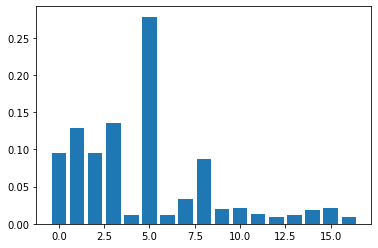

In [31]:
# reduced vars 
modelRFC.fit(x1.drop(['V2','V6','V22','V24','V28'],axis=1), y1)
# get importance
importance_RT1 = modelRFC.feature_importances_
# summarize feature importance
for i,v in enumerate(importance_RT1):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance_RT1))], importance_RT1)
pyplot.show()



based on the analysis, V13,V15,V19,V23,V25,V26,s,are discarded as their importance is less than 2.15 %
scaled_time  is not discarded as it is the only other var that is not on PCA

#reduced df create the model. 
So the end model has V4,V10,V11,V12,V14,V16,V17,V19,V20,V27,scaled_time ,scaled_amount

#Negative corr 
#class-v10,v12,v14,v17,v16
#Positive Corr 
#class-v2,v14,v11,v19 

# MODEL in BALANCED DATA

In [12]:
selectedmodel=New_df[['Class','V4','V10','V11','V12','V14','V16','V17','V19','V20','V27','scaled_amount','scaled_time']]
x_us=selectedmodel.drop(['Class'],axis=1)
y_us=selectedmodel['Class']


In [13]:
from sklearn.model_selection import train_test_split

# This is explicitly used for undersampling.
x_us_train, x_us_test, y_us_train, y_us_test = train_test_split(x_us, y_us, test_size=0.2, random_state=42)
x_us_train = x_us_train.values
x_us_test = x_us_test.values
y_us_train = y_us_train.values
y_us_test =y_us_test.values

In [14]:
#https://towardsdatascience.com/support-vector-machine-support-vector-classifier-maximal-margin-classifier-22648a38ad9c#:~:text=The%20fact%20that%20the%20support%20vector%20classifier%20decision,support%20vector%20classifier%20different%20form%20any%20other%20classifier.

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import collections

classifiers = {
    "LogisiticRegression": LogisticRegression(),
    "KNearest": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
    "DecisionTreeClassifier": DecisionTreeClassifier()
}


from sklearn.model_selection import cross_val_score


for key, classifier in classifiers.items():
    classifier.fit(x_us_train, y_us_train)
    training_score = cross_val_score(classifier, x_us_train, y_us_train, cv=5)
    print("Classifiers: ", classifier.__class__.__name__, "Has a training score of", round(training_score.mean(), 2) * 100, "% accuracy score")

Classifiers:  LogisticRegression Has a training score of 94.0 % accuracy score
Classifiers:  KNeighborsClassifier Has a training score of 93.0 % accuracy score
Classifiers:  SVC Has a training score of 93.0 % accuracy score
Classifiers:  DecisionTreeClassifier Has a training score of 90.0 % accuracy score


In [15]:
for key, classifier in classifiers.items():
    m_score=classifier.score(x_us_test,y_us_test)
    print("Classifiers: ", classifier.__class__.__name__, "has score of  ", m_score)

Classifiers:  LogisticRegression has score of   0.9390862944162437
Classifiers:  KNeighborsClassifier has score of   0.9289340101522843
Classifiers:  SVC has score of   0.934010152284264
Classifiers:  DecisionTreeClassifier has score of   0.8934010152284264


In [17]:
for key, classifier in classifiers.items():
    y_predict=classifier.predict(x_us_test)
    error = sum(y_us_test-y_predict)
    print("Classifiers: ", classifier.__class__.__name__, "Has a error  of ", round(error, 2), "%")

Classifiers:  LogisticRegression Has a error  of  6 %
Classifiers:  KNeighborsClassifier Has a error  of  8 %
Classifiers:  SVC Has a error  of  9 %
Classifiers:  DecisionTreeClassifier Has a error  of  -1 %


In [39]:
 # We will undersample during cross validating 
    
#log_reg_cf = confusion_matrix(y_test, y_pred_log_reg)
#kneighbors_cf = confusion_matrix(y_test, y_pred_knear)
#svc_cf = confusion_matrix(y_test, y_pred_svc)
#tree_cf = confusion_matrix(y_test, y_pred_tree)
  

In [18]:
from sklearn.metrics import confusion_matrix

#fig, ax = plt.subplots(2, 2,figsize=(22,12))

for key, classifier in classifiers.items():
    classifier.fit(x_us_train, y_us_train)
    CF=confusion_matrix(y_us_test,y_predict) 
    print("Classifiers: ", classifier.__class__.__name__,"Confusion Matrix", CF)
#sns.heatmap(CF,)

Classifiers:  LogisticRegression Confusion Matrix [[ 76  11]
 [ 10 100]]
Classifiers:  KNeighborsClassifier Confusion Matrix [[ 76  11]
 [ 10 100]]
Classifiers:  SVC Confusion Matrix [[ 76  11]
 [ 10 100]]
Classifiers:  DecisionTreeClassifier Confusion Matrix [[ 76  11]
 [ 10 100]]


### Same steps with individual steps!

In [34]:
Log_regg= LogisticRegression().fit(x_us_train, y_us_train)
KNearest= KNeighborsClassifier().fit(x_us_train, y_us_train)
SupportVectorClassifier=SVC().fit(x_us_train, y_us_train)
DecisionTreeClassifier = DecisionTreeClassifier.fit(x_us_train, y_us_train)

In [33]:
log_reg_score = cross_val_score(Log_regg,x_us_train, y_us_train, cv=5)
print('Logistic Regression Cross Validation Score: ', round(log_reg_score.mean() * 100, 2).astype(str) + '%')

knears_score = cross_val_score(KNearest, x_us_train, y_us_train, cv=5)
print('Knears Neighbors Cross Validation Score', round(knears_score.mean() * 100, 2).astype(str) + '%')

svc_score = cross_val_score(SupportVectorClassifier, x_us_train, y_us_train, cv=5)
print('Support Vector Classifier Cross Validation Score', round(svc_score.mean() * 100, 2).astype(str) + '%')

tree_score = cross_val_score(DecisionTreeClassifier, x_us_train, y_us_train, cv=5)
print('DecisionTree Classifier Cross Validation Score', round(tree_score.mean() * 100, 2).astype(str) + '%')

Logistic Regression Cross Validation Score:  93.65%
Knears Neighbors Cross Validation Score 93.14%
Support Vector Classifier Cross Validation Score 92.76%
DecisionTree Classifier Cross Validation Score 91.23%


In [46]:
log_reg_test_score = Log_regg.score(x_us_train,y_us_train)
print('Logistic Regression Score: ', round(log_reg_test_score * 100, 2).astype(str) + '%')

knears_test_score = KNearest.score(x_us_train,y_us_train)
print('Knears Neighbors  Score', round(knears_test_score * 100, 2).astype(str) + '%')

svc_test_score = SupportVectorClassifier.score(x_us_train,y_us_train)
print('Support Vector Classifier  Score', round(svc_test_score  * 100, 2).astype(str) + '%')

tree_test_score = DecisionTreeClassifier.score(x_us_train,y_us_train)
print('DecisionTree Classifier  Score', round(tree_test_score  * 100, 2).astype(str) + '%')

Logistic Regression Score:  93.77%
Knears Neighbors  Score 94.79%
Support Vector Classifier  Score 93.9%
DecisionTree Classifier  Score 100.0%


In [21]:
log_reg_test_score = Log_regg.score(x_us_test,y_us_test)
print('Logistic Regression Score: ', round(log_reg_test_score * 100, 2).astype(str) + '%')

knears_test_score = KNearest.score(x_us_test,y_us_test)
print('Knears Neighbors  Score', round(knears_test_score * 100, 2).astype(str) + '%')

svc_test_score = SupportVectorClassifier.score(x_us_test,y_us_test)
print('Support Vector Classifier  Score', round(svc_test_score  * 100, 2).astype(str) + '%')

tree_test_score = DecisionTreeClassifier.score(x_us_test,y_us_test)
print('DecisionTree Classifier  Score', round(tree_test_score  * 100, 2).astype(str) + '%')

Logistic Regression Score:  93.91%
Knears Neighbors  Score 92.89%
Support Vector Classifier  Score 93.4%
DecisionTree Classifier  Score 88.83%


# case of overfitting!
Confusion Matrix:
Positive/Negative: Type of Class (label) ["No", "Yes"] True/False: Correctly or Incorrectly classified by the model.
True Negatives (Top-Left Square): This is the number of correctly classifications of the "No" (No Fraud Detected) class.
False Negatives (Top-Right Square): This is the number of incorrectly classifications of the "No"(No Fraud Detected) class.
False Positives (Bottom-Left Square): This is the number of incorrectly classifications of the "Yes" (Fraud Detected) class
True Positives (Bottom-Right Square): This is the number of correctly classifications of the "Yes" (Fraud Detected) class.

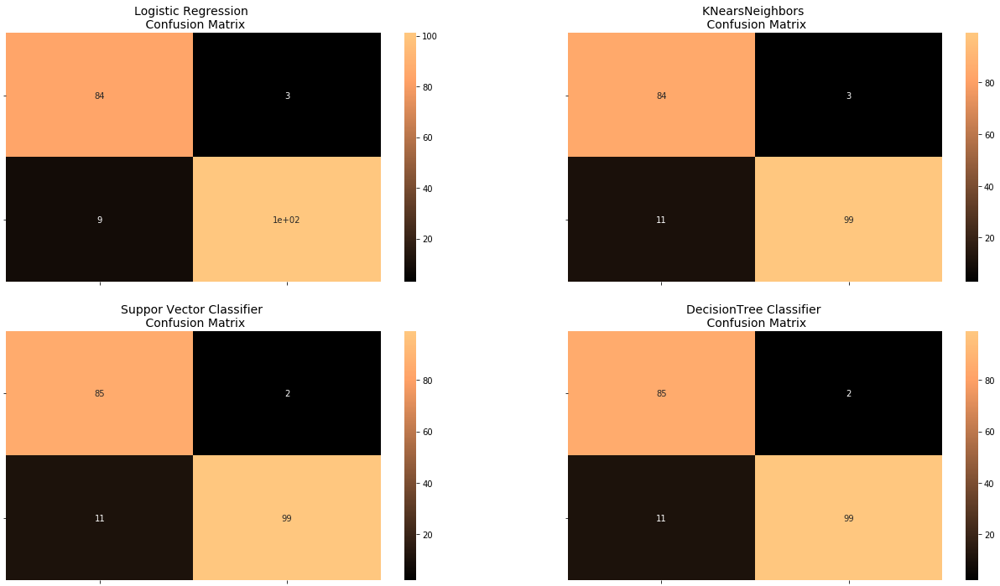

In [22]:

# confusion matrix on balanced data
y_pred_log=Log_regg.predict(x_us_test)
y_pred_knear = KNearest.predict(x_us_test)
y_pred_svc = SupportVectorClassifier.predict(x_us_test)
y_pred_tree = SupportVectorClassifier.predict(x_us_test)


log_reg_cf = confusion_matrix(y_us_test, y_pred_log)
kneighbors_cf = confusion_matrix(y_us_test, y_pred_knear)
svc_cf = confusion_matrix(y_us_test, y_pred_svc)
tree_cf = confusion_matrix(y_us_test,y_pred_tree)

fig, ax = plt.subplots(2, 2,figsize=(22,12))

sns.heatmap(log_reg_cf, ax=ax[0][0], annot=True, cmap=plt.cm.copper)
ax[0, 0].set_title("Logistic Regression \n Confusion Matrix", fontsize=14)
ax[0, 0].set_xticklabels(['', ''], fontsize=14, rotation=90)
ax[0, 0].set_yticklabels(['', ''], fontsize=14, rotation=360)

sns.heatmap(kneighbors_cf, ax=ax[0][1], annot=True, cmap=plt.cm.copper)
ax[0][1].set_title("KNearsNeighbors \n Confusion Matrix", fontsize=14)
ax[0][1].set_xticklabels(['', ''], fontsize=14, rotation=90)
ax[0][1].set_yticklabels(['', ''], fontsize=14, rotation=360)

sns.heatmap(svc_cf, ax=ax[1][0], annot=True, cmap=plt.cm.copper)
ax[1][0].set_title("Suppor Vector Classifier \n Confusion Matrix", fontsize=14)
ax[1][0].set_xticklabels(['', ''], fontsize=14, rotation=90)
ax[1][0].set_yticklabels(['', ''], fontsize=14, rotation=360)

sns.heatmap(tree_cf, ax=ax[1][1], annot=True, cmap=plt.cm.copper)
ax[1][1].set_title("DecisionTree Classifier \n Confusion Matrix", fontsize=14)
ax[1][1].set_xticklabels(['', ''], fontsize=14, rotation=90)
ax[1][1].set_yticklabels(['', ''], fontsize=14, rotation=360)


plt.show()

In [23]:
from sklearn.metrics import classification_report


print('Logistic Regression:')
print(classification_report(y_us_test, y_pred_log))

print('KNears Neighbors:')
print(classification_report(y_us_test, y_pred_knear))

print('Support Vector Classifier:')
print(classification_report(y_us_test, y_pred_svc))

print('Decision tree classifier:')
print(classification_report(y_us_test,y_pred_tree))

Logistic Regression:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93        87
           1       0.97      0.92      0.94       110

    accuracy                           0.94       197
   macro avg       0.94      0.94      0.94       197
weighted avg       0.94      0.94      0.94       197

KNears Neighbors:
              precision    recall  f1-score   support

           0       0.88      0.97      0.92        87
           1       0.97      0.90      0.93       110

    accuracy                           0.93       197
   macro avg       0.93      0.93      0.93       197
weighted avg       0.93      0.93      0.93       197

Support Vector Classifier:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93        87
           1       0.98      0.90      0.94       110

    accuracy                           0.93       197
   macro avg       0.93      0.94      0.93       197
weighted

# Fitting model on Original Data

## Implementing SMOTE Technique

In [36]:
 pip install --upgrade scikit-learn

Requirement already up-to-date: scikit-learn in c:\anaconda3\lib\site-packages (0.24.1)
Note: you may need to restart the kernel to use updated packages.


In [24]:
#https://anaconda.org/conda-forge/imbalanced-learn
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE

from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold

from imblearn.over_sampling import SMOTE

In [38]:
from imblearn.under_sampling import NearMiss
import imblearn
imblearn.__version__

'0.7.0'

### SMOTE

# SMOTE Technique (Over-Sampling):
<img src="https://raw.githubusercontent.com/rikunert/SMOTE_visualisation/master/SMOTE_R_visualisation_3.png", width=800> SMOTE stands for Synthetic Minority Over-sampling Technique. Unlike Random UnderSampling, SMOTE creates new synthetic points in order to have an equal balance of the classes. This is another alternative for solving the "class imbalance problems".


Understanding SMOTE:

Solving the Class Imbalance: SMOTE creates synthetic points from the minority class in order to reach an equal balance between the minority and majority class.
Location of the synthetic points: SMOTE picks the distance between the closest neighbors of the minority class, in between these distances it creates synthetic points.
Final Effect: More information is retained since we didn't have to delete any rows unlike in random undersampling.
Accuracy || Time Tradeoff: Although it is likely that SMOTE will be more accurate than random under-sampling, it will take more time to train since no rows are eliminated as previously stated.

In [25]:
#implementing SMOTE in Logistic regression

from imblearn.over_sampling import SMOTE
accuracy_lst = []
precision_lst = []
recall_lst = []
f1_lst = []
auc_lst = []

for train, test in stkf.split(original_Xtrain, original_Ytrain):
    pipeline = imbalanced_make_pipeline(SMOTE(sampling_strategy='minority'),Log_regg) # SMOTE happens during Cross Validation not before..
    model = pipeline.fit(original_Xtrain[train], original_Ytrain[train])
    prediction = Log_regg.predict(original_Xtrain[test])
    accuracy_lst.append(pipeline.score(original_Xtrain[test], original_Ytrain[test]))
    precision_lst.append(precision_score(original_Ytrain[test], prediction))
    recall_lst.append(recall_score(original_Ytrain[test], prediction))
    f1_lst.append(f1_score(original_Ytrain[test], prediction))
    auc_lst.append(roc_auc_score(original_Ytrain[test], prediction))


print('---' * 45)
print('')
print("accuracy: {}".format(np.mean(accuracy_lst)))
print("precision: {}".format(np.mean(precision_lst)))
print("recall: {}".format(np.mean(recall_lst)))
print("f1: {}".format(np.mean(f1_lst)))
print('---' * 45)





C:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
C:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_

---------------------------------------------------------------------------------------------------------------------------------------

accuracy: 0.9425100695767785
precision: 0.061068551743605
recall: 0.9162934112301201
f1: 0.11271073613773068
---------------------------------------------------------------------------------------------------------------------------------------


In [42]:
accuracy_lst

[0.9743910467412772,
 0.9749610480809322,
 0.978603875441638,
 0.9738418661809564,
 0.9773091355965678]

In [45]:
f1_lst 


[0.11254752851711025,
 0.10928961748633881,
 0.128686327077748,
 0.10644677661169415,
 0.11925042589437819]

In [46]:
auc_lst 

[0.9555826733289017,
 0.9362649360341211,
 0.9450565014984514,
 0.9363532394099691,
 0.9317717623291807]

In [26]:
precision_lst 

[0.008313164263916657,
 0.059397884458909686,
 0.09006622516556291,
 0.06501831501831502,
 0.08254716981132075]

In [44]:
recall_lst


[0.9367088607594937,
 0.8974358974358975,
 0.9113924050632911,
 0.8987341772151899,
 0.8860759493670886]

In [28]:
labels = ['No Fraud', 'Fraud']
smote_prediction = Log_regg.predict(original_Xtest)
print(classification_report(original_Ytest, smote_prediction, target_names=labels))

              precision    recall  f1-score   support

    No Fraud       1.00      0.99      0.99     56863
       Fraud       0.11      0.85      0.19        98

    accuracy                           0.99     56961
   macro avg       0.55      0.92      0.59     56961
weighted avg       1.00      0.99      0.99     56961



In [30]:
Logistic_fm_cf = confusion_matrix(y_true=original_Ytest, y_pred=smote_prediction)
Logistic_fm_cf

array([[56190,   673],
       [   15,    83]], dtype=int64)

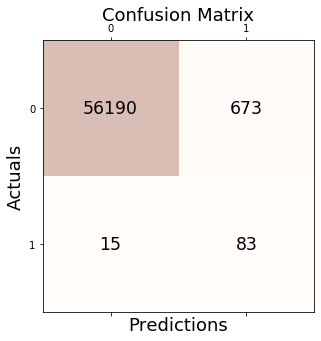

In [31]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(Logistic_fm_cf, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(Logistic_fm_cf.shape[0]):
    for j in range(Logistic_fm_cf.shape[1]):
        ax.text(x=j, y=i,s=Logistic_fm_cf[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()